In [1]:
import pandas as pd
import requests

data = requests.get('https://www.levels.fyi/js/salaryData.json').json()
df = pd.DataFrame(data)

In [2]:
df.head()

,timestamp,company,level,title,totalyearlycompensation,location,yearsofexperience,yearsatcompany,tag,basesalary,stockgrantvalue,bonus,gender,otherdetails,cityid,dmaid,rowNumber
0,6/7/2017 11:33:27,Oracle,L3,Product Manager,127,"Redwood City, CA",1.5,1.5,,107,20,10,,,7392,807,1
1,6/10/2017 17:11:29,eBay,SE 2,Software Engineer,100,"San Francisco, CA",5,3,,,,,,,7419,807,2
2,6/11/2017 14:53:57,Amazon,L7,Product Manager,310,"Seattle, WA",8,0,,155,,,,,11527,819,3
3,6/13/2017 5:35:36,Uber,Senior,Software Engineer,578,"San Francisco, CA",10,2,,180000,1550000,9000,,Stock based on $48.65 per share.,7419,807,4
4,6/14/2017 21:22:25,Microsoft,64,Software Engineering Manager,200,"Redmond, WA",9,9,,169000,100000,30000,,,11521,819,5


In [3]:
import numpy as np

df = df.drop(['cityid', 'dmaid','rowNumber'], axis=1)
df = df.replace("", np.nan)

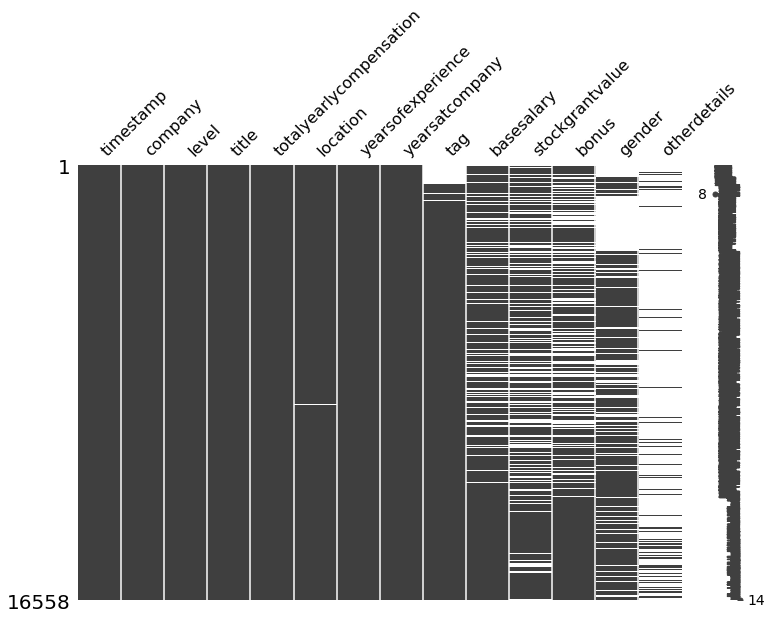

In [4]:
import missingno as msno

msno.matrix(df, figsize=(12, 8))

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16558 entries, 0 to 16557
Data columns (total 14 columns):
timestamp                  16558 non-null object
company                    16558 non-null object
level                      16558 non-null object
title                      16558 non-null object
totalyearlycompensation    16558 non-null object
location                   16557 non-null object
yearsofexperience          16558 non-null object
yearsatcompany             16558 non-null object
tag                        15772 non-null object
basesalary                 14077 non-null object
stockgrantvalue            12085 non-null object
bonus                      12317 non-null object
gender                     11524 non-null object
otherdetails               1973 non-null object
dtypes: object(14)
memory usage: 1.8+ MB


In [6]:
df['timestamp'] = pd.to_datetime(df['timestamp'])
df[['yearsofexperience','basesalary','bonus','stockgrantvalue','totalyearlycompensation','yearsatcompany']] = df[['yearsofexperience','basesalary','bonus','stockgrantvalue','totalyearlycompensation','yearsatcompany']].apply(pd.to_numeric)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16558 entries, 0 to 16557
Data columns (total 14 columns):
timestamp                  16558 non-null datetime64[ns]
company                    16558 non-null object
level                      16558 non-null object
title                      16558 non-null object
totalyearlycompensation    16558 non-null float64
location                   16557 non-null object
yearsofexperience          16558 non-null float64
yearsatcompany             16558 non-null float64
tag                        15772 non-null object
basesalary                 14077 non-null float64
stockgrantvalue            12085 non-null float64
bonus                      12317 non-null float64
gender                     11524 non-null object
otherdetails               1973 non-null object
dtypes: datetime64[ns](1), float64(6), object(7)
memory usage: 1.8+ MB


In [7]:
import pandas_profiling as pp

df.profile_report(style={'full_width':True})

In [8]:
df = df[df['totalyearlycompensation'].between(df['totalyearlycompensation'].quantile(.05),df['totalyearlycompensation'].quantile(.95))]

df.profile_report(style={'full_width':True})

In [9]:
df.query("company in ('Facebook','Amazon','Apple','Netflix','Google') and title in ('Software Engineer') and yearsofexperience>4 and yearsofexperience<16").profile_report(style={'full_width':True})

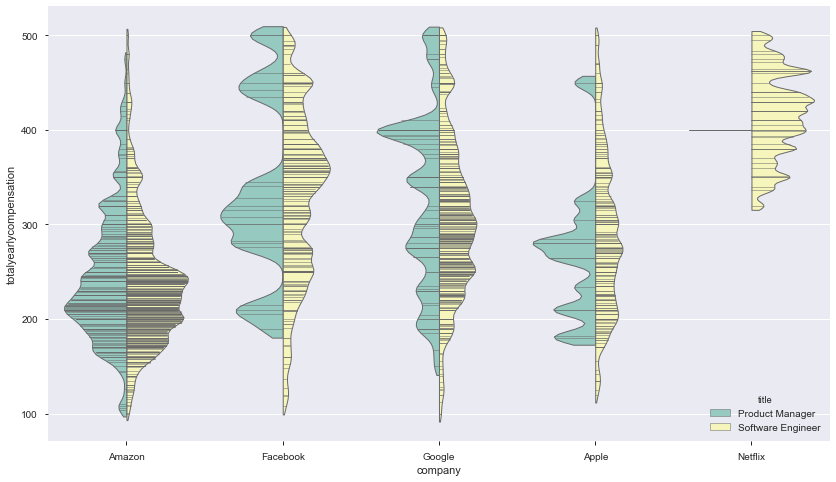

In [16]:
#advanced visualization to transform the data and graph in a violin plot
import seaborn as sns
import matplotlib.pyplot as plt

faang = df.query("company in ('Facebook','Amazon','Apple','Netflix','Google') and title in ('Product Manager','Software Engineer') and yearsofexperience>4 and yearsofexperience<16")

plt.figure(figsize=(14, 8))
g = sns.violinplot(data=faang, palette="Set3", split = True, x='company',hue='title',y='totalyearlycompensation',
                   inner='stick', bw=.1, cut=1, linewidth=1)

Imported AutoViz_Class version: 0.0.67. Call using: 
    from autoviz.AutoViz_Class import AutoViz_Class
    AV = AutoViz_Class()
    AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=0,
                            lowess=False,chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30)
            
To remove previous versions, perform 'pip uninstall autoviz'
Shape of your Data Set: (10214, 14)
Classifying variables in data set...
    13 Predictors classified...
        This does not include the Target column(s)
    6 variables removed since they were ID or low-information variables
    List of variables removed: ['title', 'company', 'level', 'location', 'tag', 'otherdetails']
Number of All Scatter Plots = 15
Could not draw Time Series plots
All Plots done
Time to run AutoViz (in seconds) = 15.160


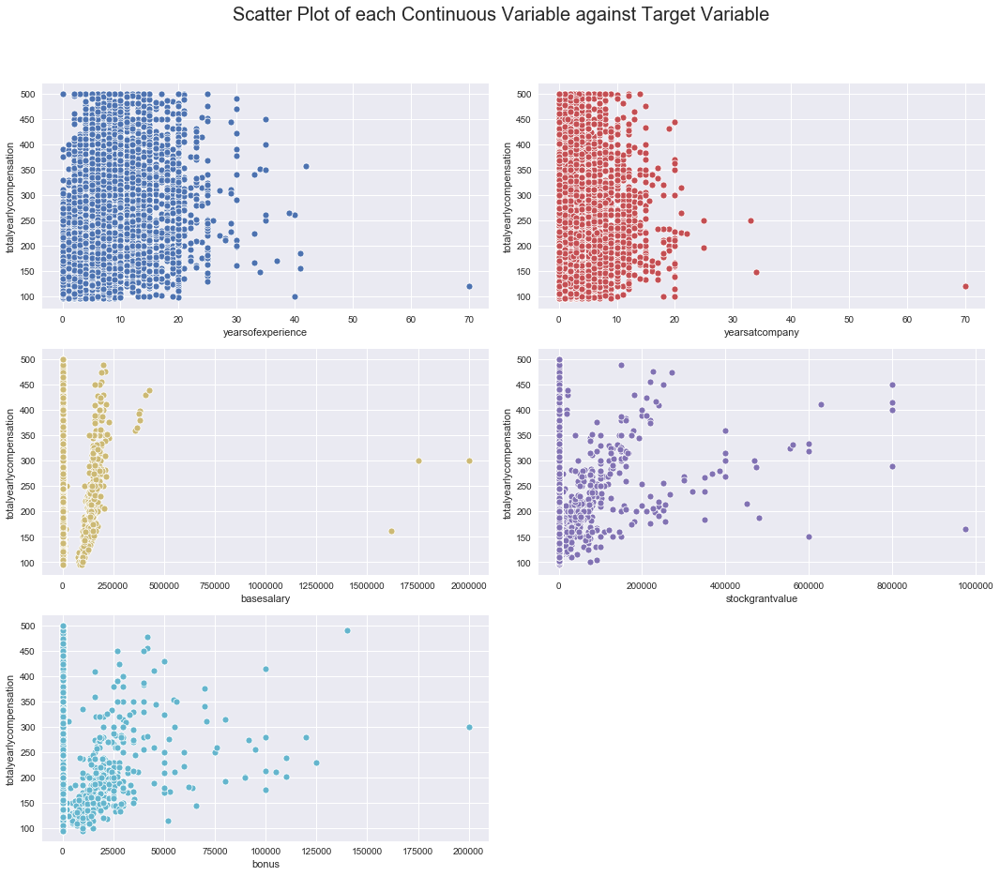

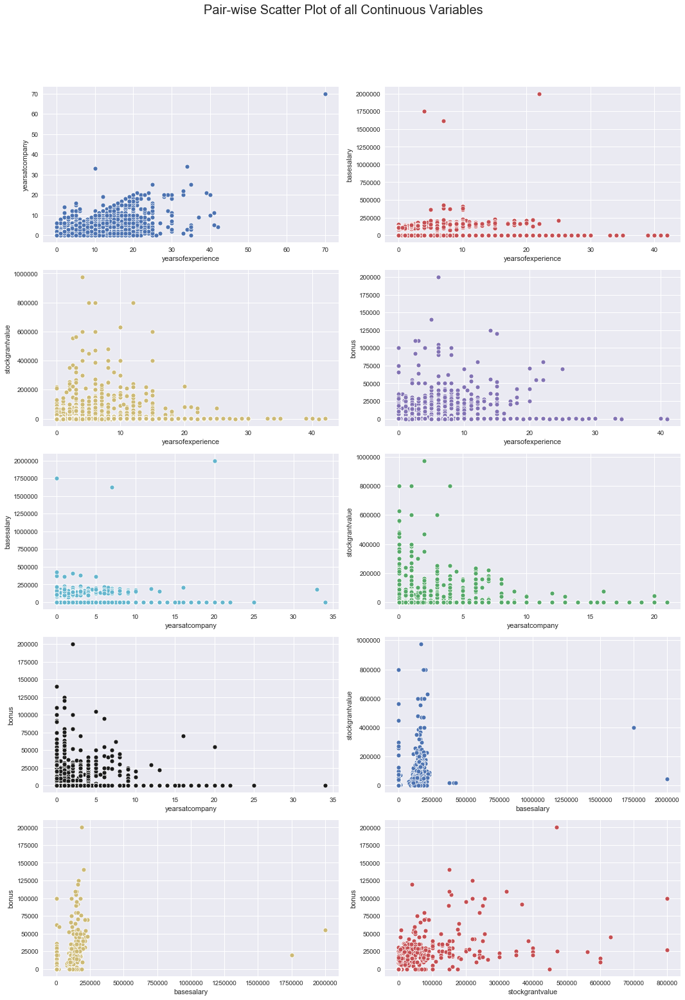

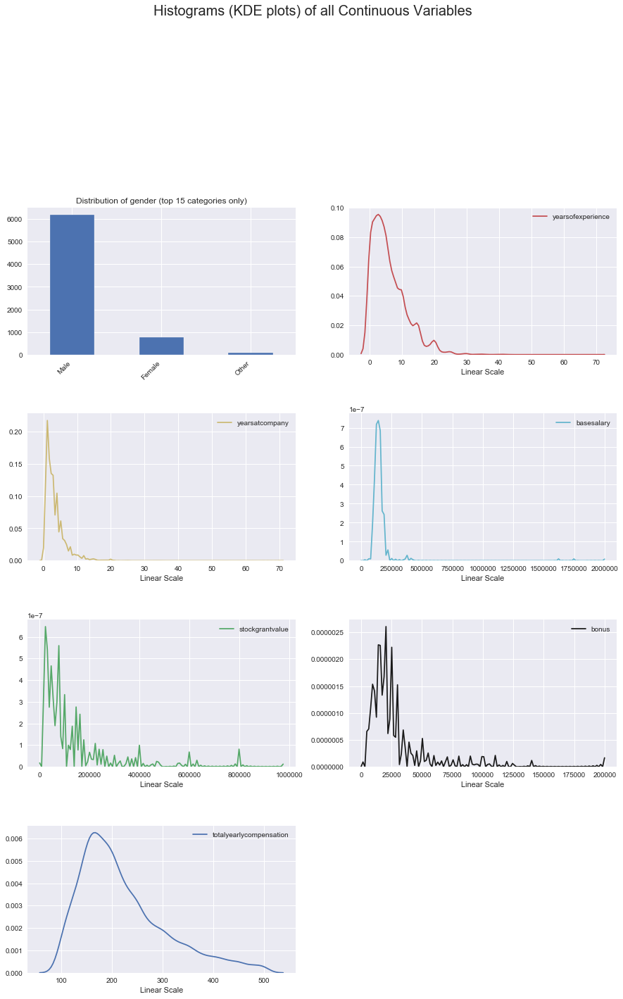

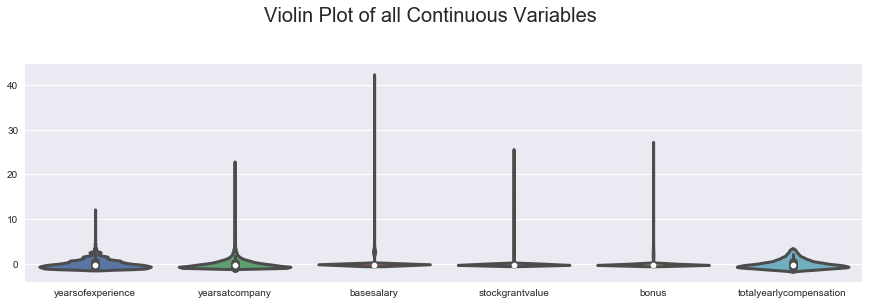

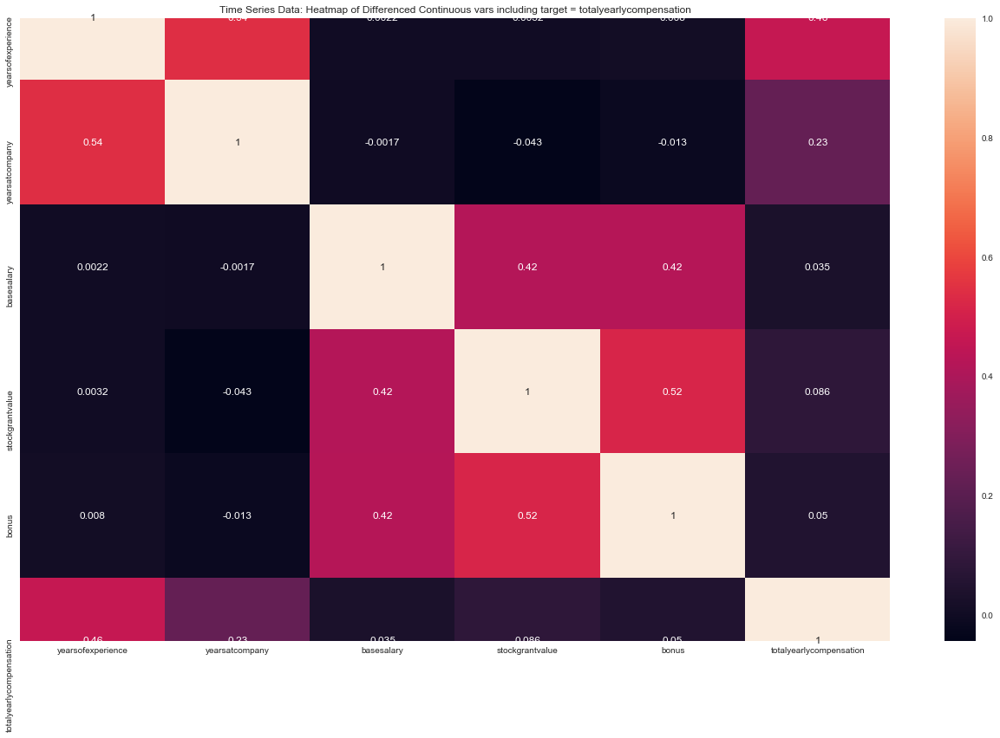

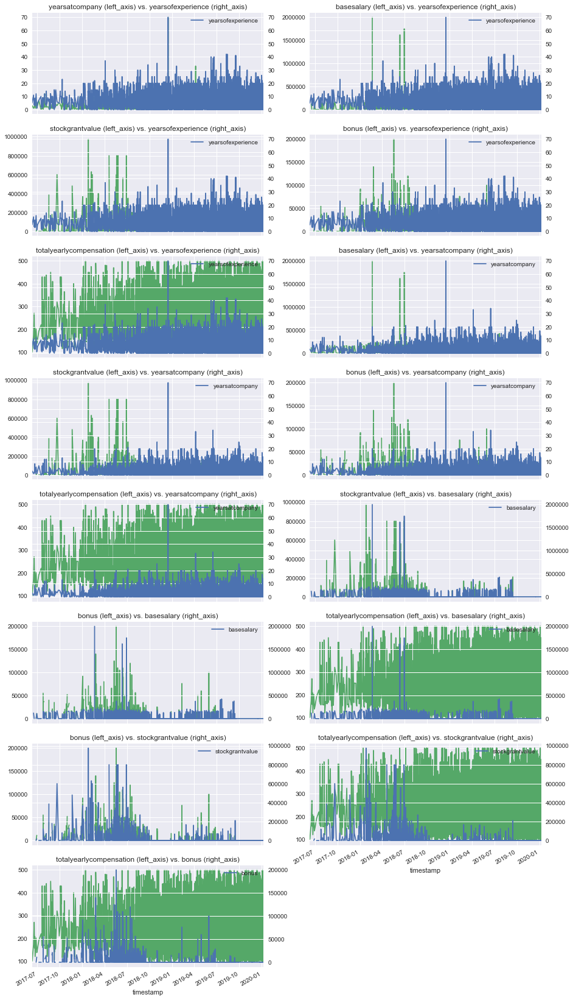

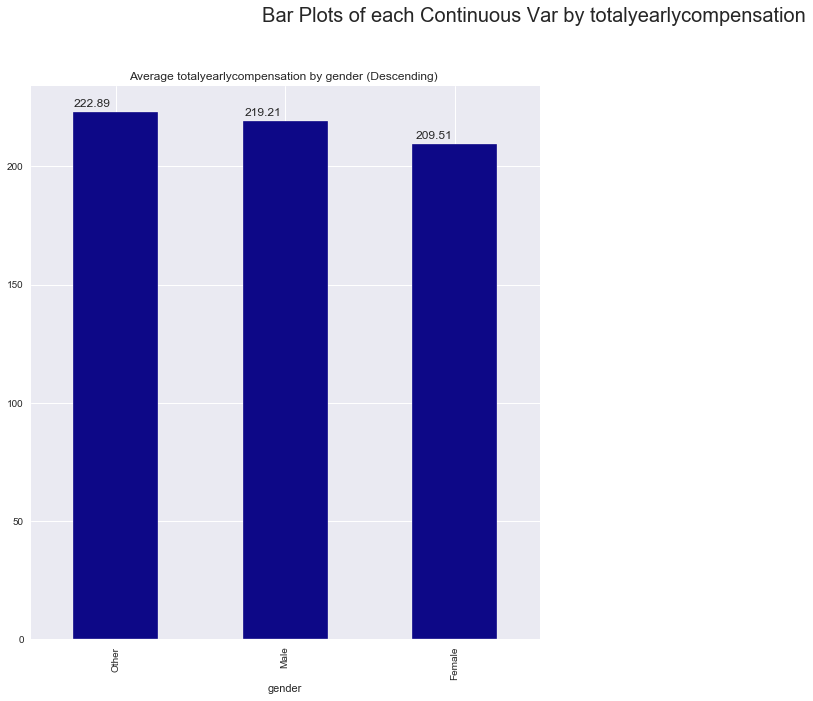

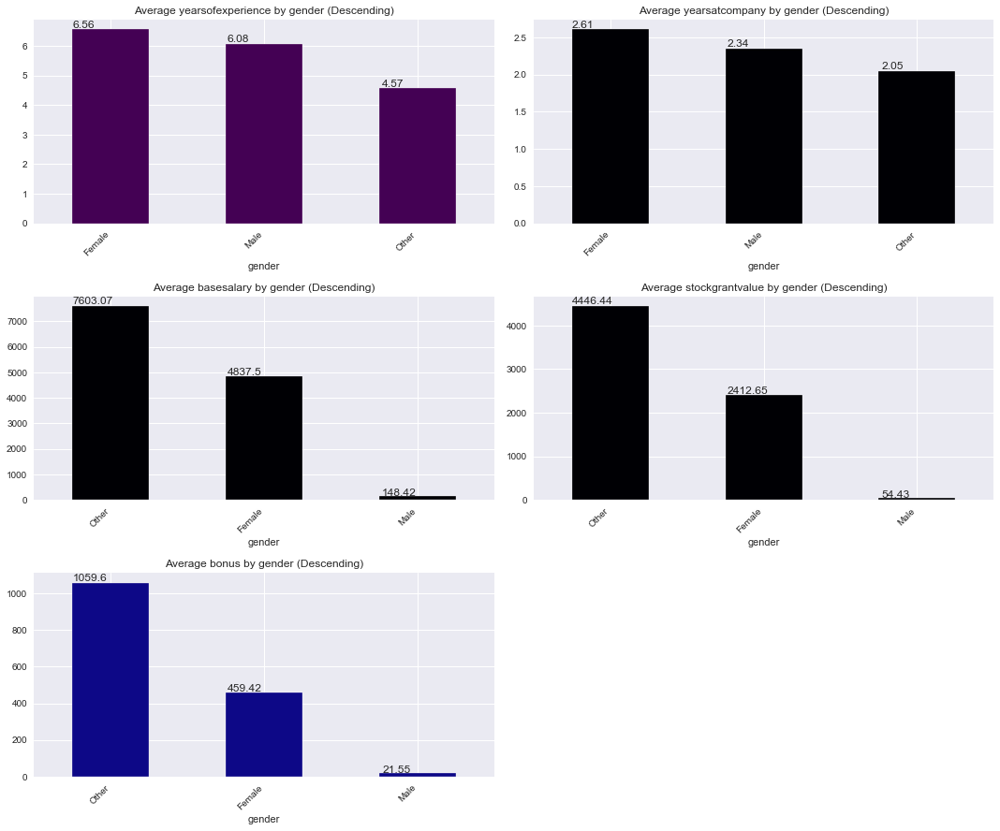

In [17]:
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()
df = df[df['title'] == 'Software Engineer']
df_av = AV.AutoViz(filename="", sep=",", depVar="totalyearlycompensation", dfte=df, header=0, verbose=2, lowess=False, chart_format="svg", max_rows_analyzed=15000, max_cols_analyzed=30)